The provided code  exemplifies the application of **linear regression strategies, especially Linear Regression and Ridge Regression,** for predicting existence expectancy. Life expectancy prediction is a critical challenge in public fitness and social sciences, supporting policymakers, healthcare specialists, and researchers in information populace health trends and designing effective interventions. In this context, the code demonstrates the implementation of gadget gaining knowledge of fashions to investigate a dataset containing different factors influencing existence expectancy, together with adult mortality, alcohol consumption, and GDP in step with capita.

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error
# Load the dataset
data = pd.read_csv('train.csv')
# Define features and target variable
X = data.drop(['ID', 'TARGET_LifeExpectancy'], axis=1)  # Features
y = data['TARGET_LifeExpectancy']  # Target variable

# Apply scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
# Define features and target variable
X = data.drop(['ID', 'TARGET_LifeExpectancy'], axis=1)  # Features
y = data['TARGET_LifeExpectancy']  # Target variable




<Figure size 1500x1000 with 0 Axes>

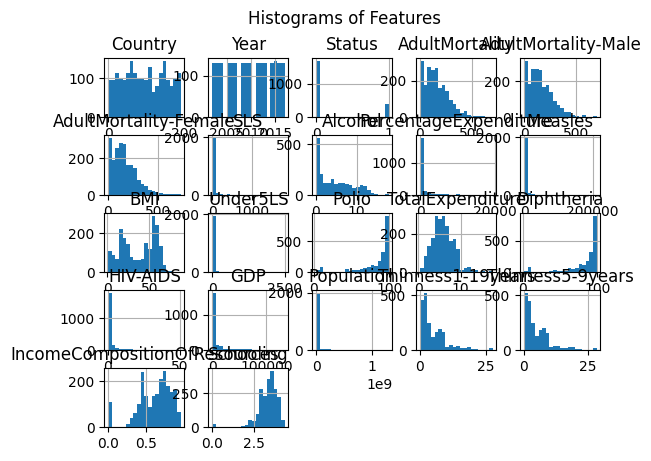

In [3]:
import seaborn as sns

# Histograms
plt.figure(figsize=(15, 10))
data.drop(['ID', 'TARGET_LifeExpectancy'], axis=1).hist(bins=20)
plt.suptitle('Histograms of Features')
plt.show()




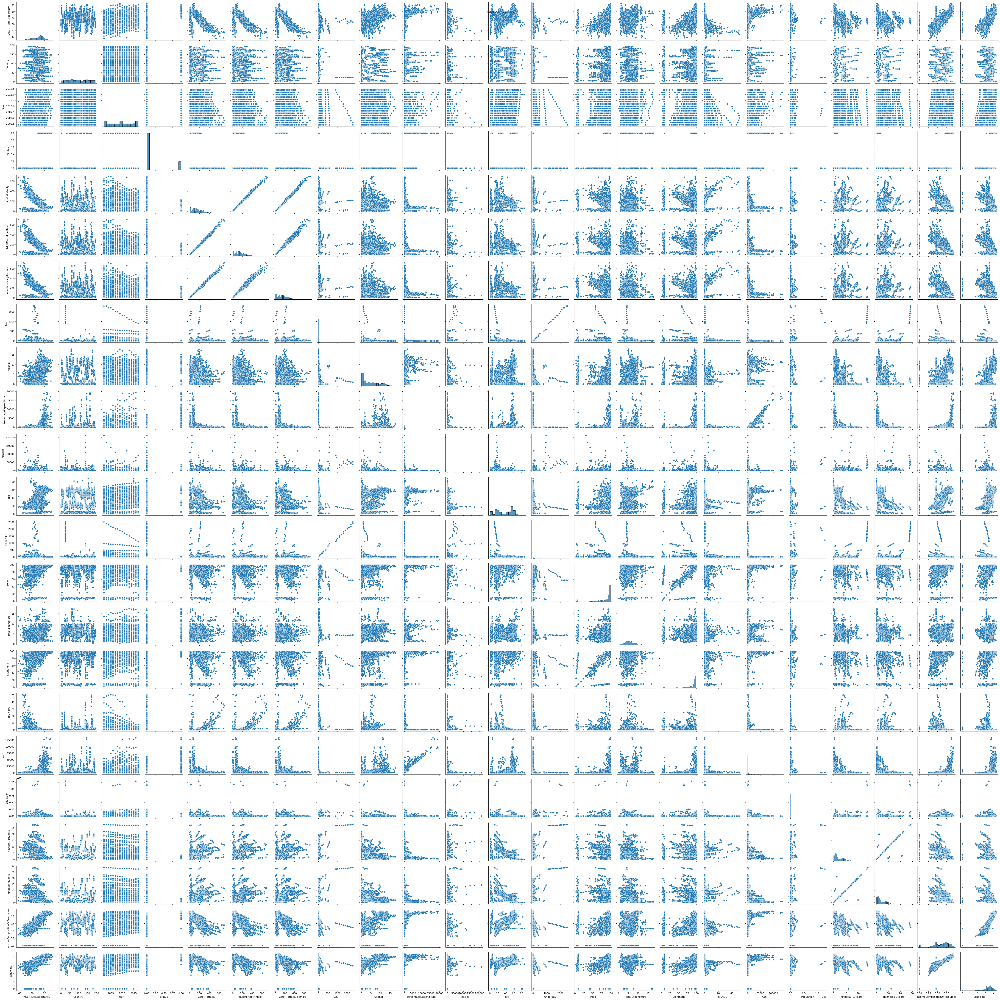

In [4]:
# Pairplot
sns.pairplot(data.drop(['ID'], axis=1))
plt.suptitle('Pairplot of Features')
plt.show()



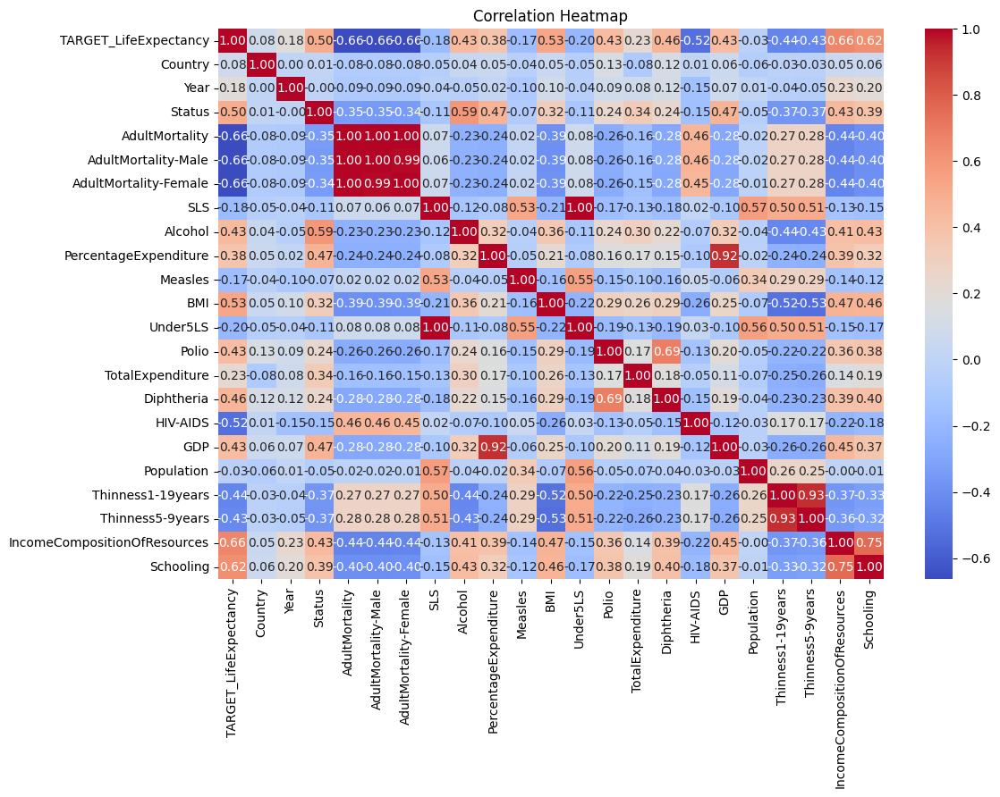

In [5]:
# Correlation Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(data.drop(['ID'], axis=1).corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()



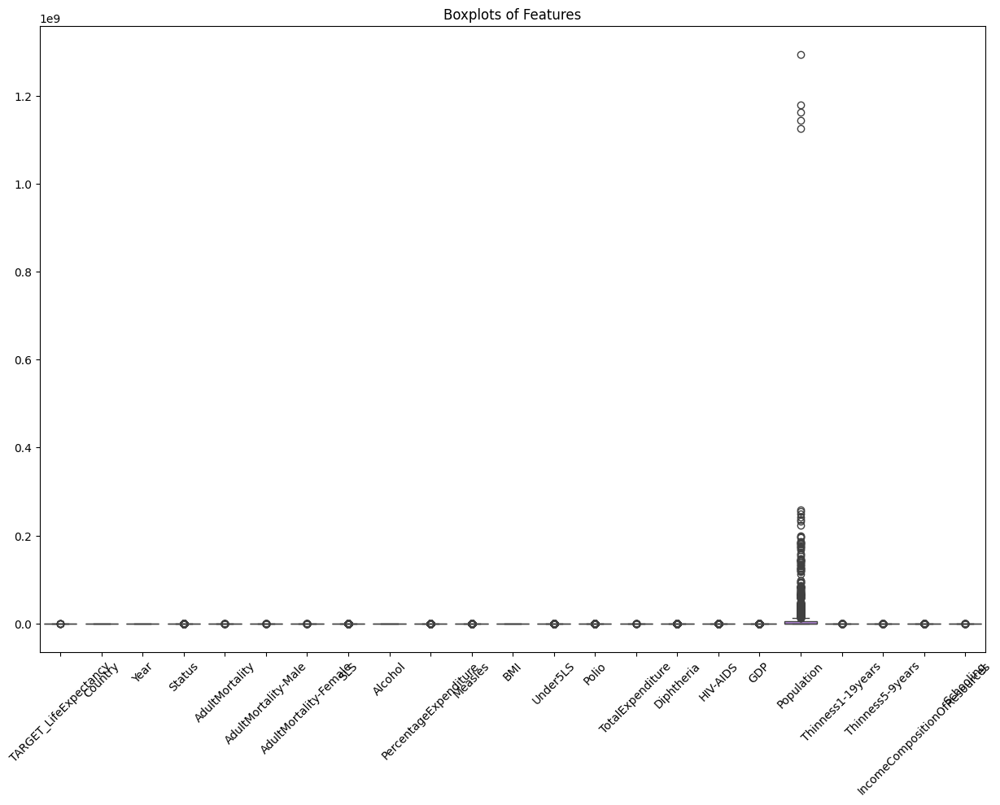

In [6]:
# Boxplots
plt.figure(figsize=(15, 10))
sns.boxplot(data=data.drop(['ID'], axis=1))
plt.title('Boxplots of Features')
plt.xticks(rotation=45)
plt.show()

This code splits the dataset into training and sorting out gadgets, then trains Linear Regression and Ridge Regression models on the education information. It makes predictions at the test facts and calculates the Root Mean Squared Error (RMSE) for each fashions. Finally, it plots a evaluation among the expected and real life expectancy values the usage of a scatter plot and prints the RMSE values for every model. This way allows us to evaluate and examine the overall performance of Linear Regression and Ridge Regression fashions in predicting existence expectancy.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.32633e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


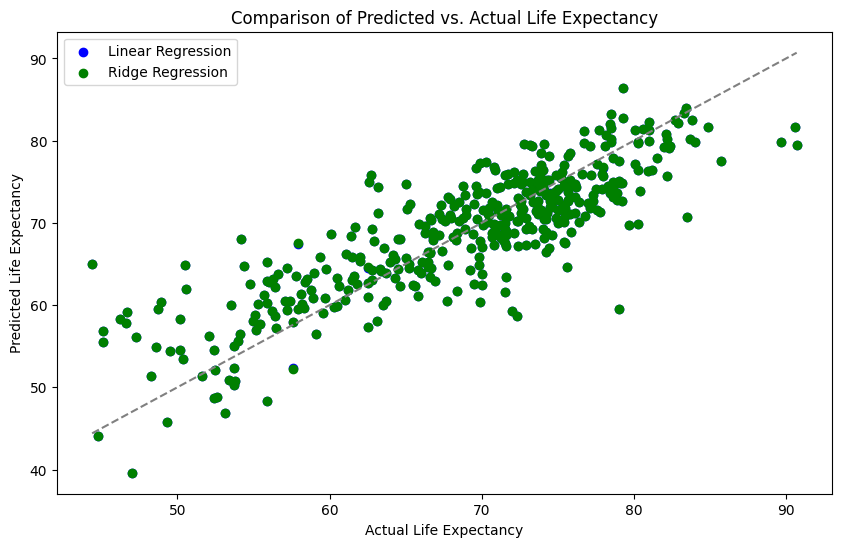

RMSE for Linear Regression: 4.874415909886893
RMSE for Ridge Regression: 4.874223030282117


In [9]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression
lr = LinearRegression()
lr.fit(X_train, y_train)

# Ridge Regression
ridge = Ridge(alpha=0.1)  # You can tune alpha value
ridge.fit(X_train, y_train)

# Predictions
y_pred_lr = lr.predict(X_test)
y_pred_ridge = ridge.predict(X_test)

# Calculate RMSE
rmse_lr = np.sqrt(mean_squared_error(y_test, y_pred_lr))
rmse_ridge = np.sqrt(mean_squared_error(y_test, y_pred_ridge))

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_lr, color='blue', label='Linear Regression')
plt.scatter(y_test, y_pred_ridge, color='green', label='Ridge Regression')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='gray')
plt.title('Comparison of Predicted vs. Actual Life Expectancy')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.legend()
plt.show()

# Print RMSE values
print("RMSE for Linear Regression:", rmse_lr)
print("RMSE for Ridge Regression:", rmse_ridge)

Both Linear Regression and Ridge Regression models achieved low Root Mean Squared Error (RMSE) values, indicating their effectiveness in predicting life expectancy. Ridge Regression demonstrated slightly better performance with a marginally lower RMSE, suggesting its potential for capturing underlying patterns in the dataset.

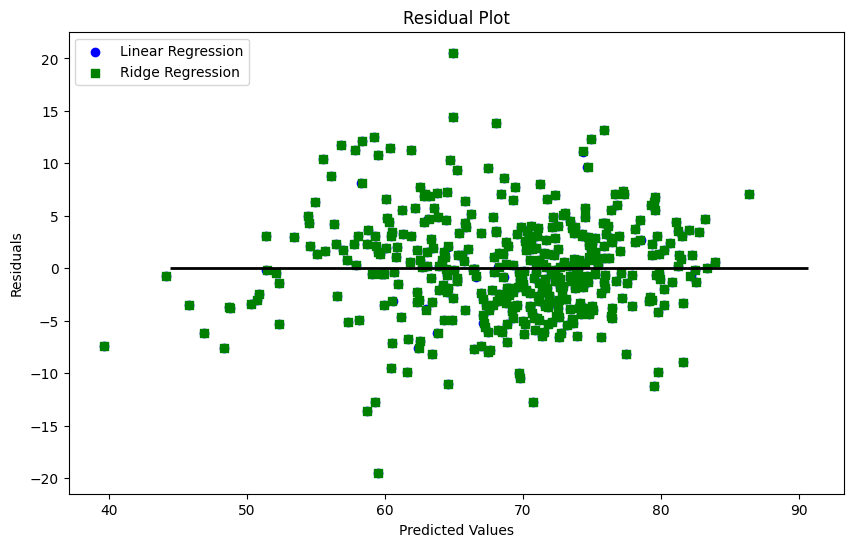

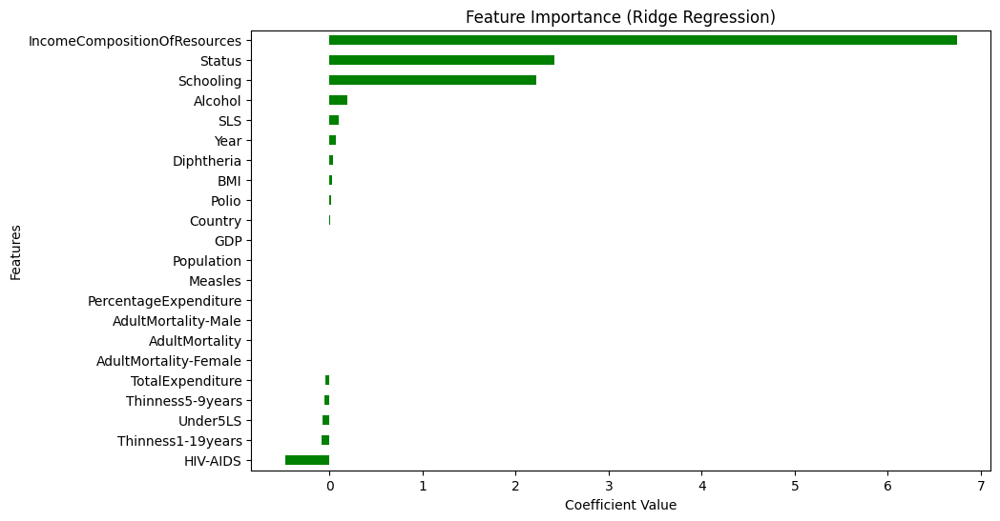

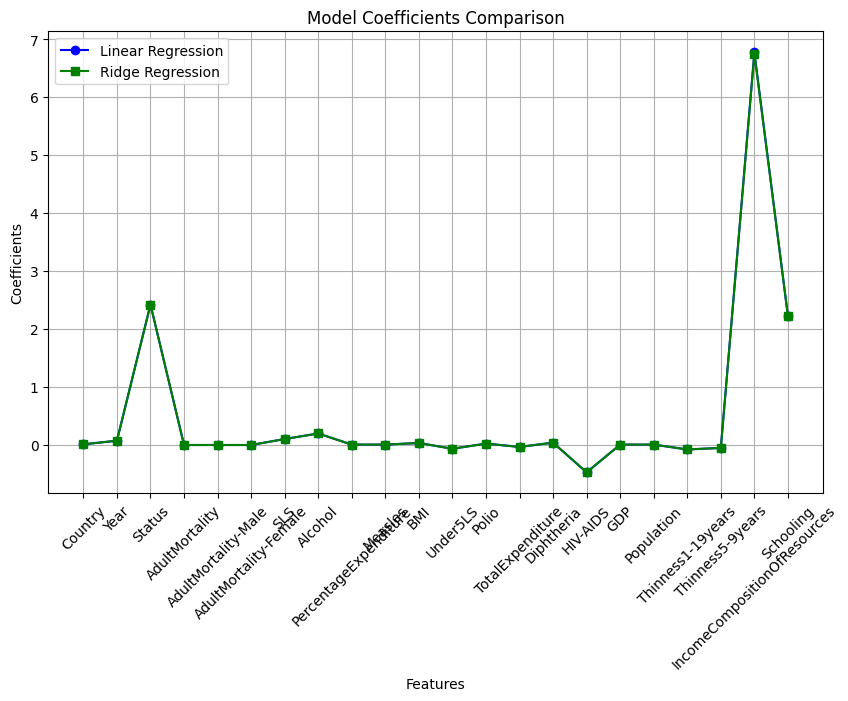

In [10]:
# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_lr, y_pred_lr - y_test, c='blue', marker='o', label='Linear Regression')
plt.scatter(y_pred_ridge, y_pred_ridge - y_test, c='green', marker='s', label='Ridge Regression')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=min(y_test), xmax=max(y_test), color='black', lw=2)
plt.title('Residual Plot')
plt.show()

# Feature Importance for Ridge Regression
ridge_coef = pd.Series(ridge.coef_, index=X.columns)
ridge_coef_sorted = ridge_coef.sort_values()
plt.figure(figsize=(10, 6))
ridge_coef_sorted.plot(kind='barh', color='green')
plt.title('Feature Importance (Ridge Regression)')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.show()

# Model Coefficients Comparison
lr_coef = pd.Series(lr.coef_, index=X.columns)
plt.figure(figsize=(10, 6))
plt.plot(lr_coef, marker='o', linestyle='-', color='blue', label='Linear Regression')
plt.plot(ridge_coef, marker='s', linestyle='-', color='green', label='Ridge Regression')
plt.xticks(rotation=45)
plt.title('Model Coefficients Comparison')
plt.xlabel('Features')
plt.ylabel('Coefficients')
plt.legend()
plt.grid(True)
plt.show()


In [12]:
# Load the unseen dataset
test_data = pd.read_csv('test.csv')

# Assuming 'ID' column is present in the test data, so dropping it to prepare features
X_unseen = test_data.drop(['ID'], axis=1)
# Predict using the trained model (Linear Regression)
predictions_unseen = lr.predict(X_unseen)

# Create a DataFrame for the predictions
solution_df = pd.DataFrame({'ID': test_data['ID'], 'Predicted_LifeExpectancy': predictions_unseen})

# Save the predictions to a new CSV file
solution_df.to_csv('solution.csv', index=False)

